In [1]:
%matplotlib inline

import pandas as pd
import geopandas
import matplotlib.pyplot as plt

## Case study - Conflict mapping: mining sites in eastern DR Congo 

In [2]:
data_visits = geopandas.read_file('cod_mines_curated_all_opendata_p_ipis.geojson')

In [3]:
data_visits.head()

,vid,cid,id,source,project,pcode,name,visit_date,visit_onsite,visit_onsite_novisitreason,...,state_service3,state_service4,itsci,traceability,qualification,childunder15,childunder15work,women,womenwork,geometry
0,1,1,130,IPIS - Ministère des Mines,IPIS - 2009,codmine00191,Eohe,2009-01-01,1,None,...,None,None,None,None,None,NaN,None,NaN,None,POINT (28.71258 0.33188)
1,2,2,101,IPIS - Ministère des Mines,IPIS - 2009,codmine00192,Eita,2009-01-01,1,None,...,None,None,None,None,None,NaN,None,NaN,None,POINT (28.69916 0.32153)
2,3,3,166,IPIS - Ministère des Mines,IPIS - 2009,codmine00242,Mungu Iko,2009-01-01,1,None,...,None,None,None,None,None,NaN,None,NaN,None,POINT (28.18514 0.54499)
3,4,4,163,IPIS - Ministère des Mines,IPIS - 2009,codmine00260,Kiviri/Tayna,2009-01-01,1,None,...,None,None,None,None,None,NaN,None,NaN,None,POINT (28.88453 -0.35253)
4,5,5,172,IPIS - Ministère des Mines,IPIS - 2009,codmine00272,Makanga,2009-01-01,1,None,...,None,None,None,None,None,NaN,None,NaN,None,POINT (28.90395 -0.03671)


In [4]:
data_visits = data_visits[['vid', 'project', 'visit_date', 'name', 'pcode', 'workers_numb' , 'interference', 'armed_group1', 'mineral1', 'geometry']]

In [5]:
data_visits.head()

,vid,project,visit_date,name,pcode,workers_numb,interference,armed_group1,mineral1,geometry
0,1,IPIS - 2009,2009-01-01,Eohe,codmine00191,300.0,NaN,None,Or,POINT (28.71258 0.33188)
1,2,IPIS - 2009,2009-01-01,Eita,codmine00192,110.0,NaN,None,Or,POINT (28.69916 0.32153)
2,3,IPIS - 2009,2009-01-01,Mungu Iko,codmine00242,NaN,NaN,FARDC,Or,POINT (28.18514 0.54499)
3,4,IPIS - 2009,2009-01-01,Kiviri/Tayna,codmine00260,NaN,NaN,FDLR,Or,POINT (28.88453 -0.35253)
4,5,IPIS - 2009,2009-01-01,Makanga,codmine00272,NaN,NaN,FDLR,Or,POINT (28.90395 -0.03671)


In [6]:
# filter only data that was visited by IPIS and that has worker numbers larger than 0
data_ipis = data_visits[data_visits['project'].str.contains('IPIS') & (data_visits['workers_numb'] > 0)]
data_ipis.head()

,vid,project,visit_date,name,pcode,workers_numb,interference,armed_group1,mineral1,geometry
0,1,IPIS - 2009,2009-01-01,Eohe,codmine00191,300.0,NaN,None,Or,POINT (28.71258 0.33188)
1,2,IPIS - 2009,2009-01-01,Eita,codmine00192,110.0,NaN,None,Or,POINT (28.69916 0.32153)
5,6,IPIS - 2009,2009-01-01,Kasongo,codmine00286,50.0,NaN,None,Or,POINT (29.42208 0.88749)
6,7,IPIS - 2009,2009-01-01,Mununze,codmine00288,20.0,NaN,None,Or,POINT (29.24183 0.59566)
7,8,IPIS - 2009,2009-01-01,Kiboto,codmine00290,300.0,NaN,None,Or,POINT (29.09466 0.45922)


In [7]:
# for those mining sites that were visited multiples times, take only the last visit
data_ipis_lastvisit = data_ipis.sort_values('visit_date').groupby('pcode', as_index=False).last()
data = geopandas.GeoDataFrame(data_ipis_lastvisit, crs=data_visits.crs)
data.head()

,pcode,vid,project,visit_date,name,workers_numb,interference,armed_group1,mineral1,geometry
0,codmine00001,660,IPIS - PROMINES MoFA 2013-2014,2013-03-27,Mayi-Tatu,150.0,1.0,FARDC,Or,POINT (29.66033 1.01089)
1,codmine00002,661,IPIS - PROMINES MoFA 2013-2014,2013-03-27,Mabanga,115.0,1.0,FARDC,Or,POINT (29.65862 1.00308)
2,codmine00003,662,IPIS - PROMINES MoFA 2013-2014,2013-03-27,Molende,130.0,1.0,FARDC,Or,POINT (29.65629 0.98563)
3,codmine00004,663,IPIS - PROMINES MoFA 2013-2014,2013-03-27,Embouchure,135.0,1.0,FARDC,Or,POINT (29.64494 0.99976)
4,codmine00005,664,IPIS - PROMINES MoFA 2013-2014,2013-03-27,Apumu-Atandele-Jerusalem-Luka Yayo,270.0,1.0,FRPI,Or,POINT (29.66000 0.95600)


In [8]:
len(data)

2460

In [9]:
protected_areas = geopandas.read_file('./Conservation/RDC_aire_protegee_2013.shp')

<AxesSubplot:>

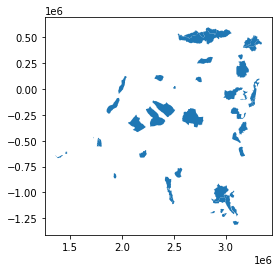

In [10]:
protected_areas.plot()

In [11]:
print(data.crs)

epsg:4326


In [12]:
protected_areas.crs


<Projected CRS: PROJCS["RDC_Mercator",GEOGCS["WGS 84",DATUM["WGS_1 ...>
Name: RDC_Mercator
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Mercator (variant B)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

<AxesSubplot:>

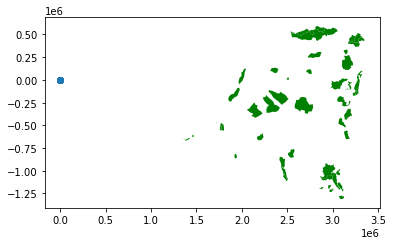

In [13]:
ax = data.plot()
protected_areas.plot(ax=ax, color='g')

In [14]:
# create a single point representing the location of Goma capital
from shapely.geometry import Point
goma = Point(29.22, 1.66)

In [15]:
# we need to convert crs
data_utm = data.to_crs(epsg=32735)
protected_areas_utm = protected_areas.to_crs(epsg=32735)

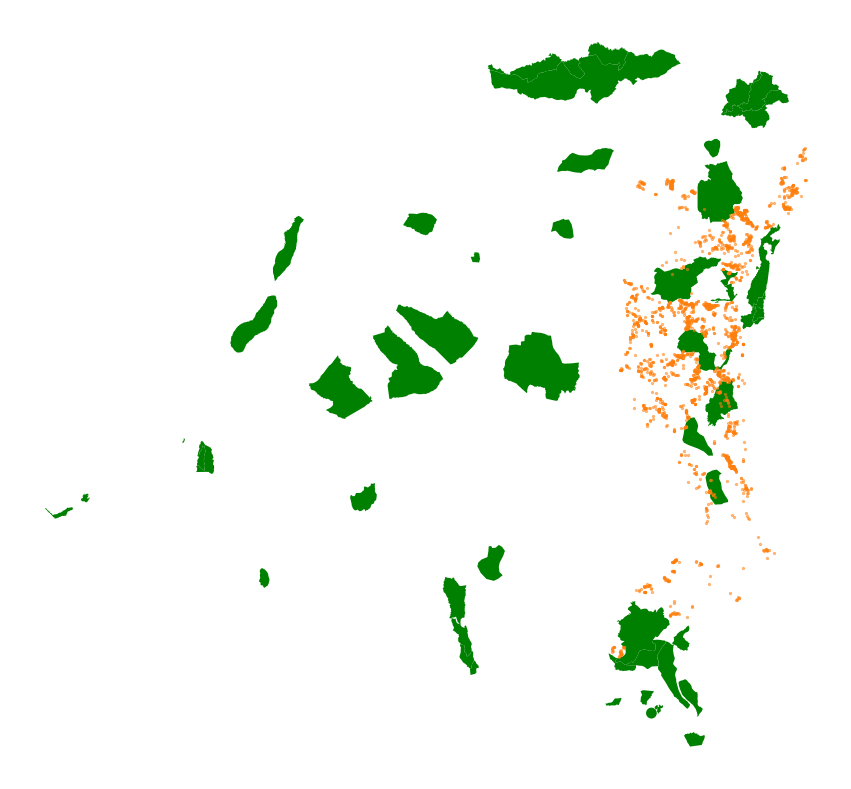

In [16]:
ax = protected_areas_utm.plot(color='g', figsize=(15, 15))
data_utm.plot(ax=ax, color='C1', markersize=5, alpha=0.5)
ax.set_axis_off()

In [17]:
# find 5 mines closest to Goma
data.distance(goma).sort_values()

C:\Users\Ivan\AppData\Local\Temp/ipykernel_14644/3556519343.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  data.distance(goma).sort_values()


1916     0.380617
1913     0.381322
1962     0.383632
2244     0.383738
2243     0.390143
          ...    
1761    11.660407
2348    11.664308
1067    11.670249
2342    11.718288
2349    11.730191
Length: 2460, dtype: float64

## Spatial operations


    Access the geometry of the "Kahuzi-Biega National park".
    Filter the mining sites to select those that are located in this national park.


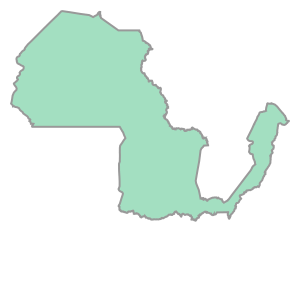

In [31]:
kahuzi = protected_areas_utm[protected_areas_utm['NAME_AP'] == "Kahuzi-Biega National park"].geometry.squeeze()
kahuzi

In [36]:
data_utm.head()

,pcode,vid,project,visit_date,name,workers_numb,interference,armed_group1,mineral1,geometry
0,codmine00001,660,IPIS - PROMINES MoFA 2013-2014,2013-03-27,Mayi-Tatu,150.0,1.0,FARDC,Or,POINT (796089.416 10111855.174)
1,codmine00002,661,IPIS - PROMINES MoFA 2013-2014,2013-03-27,Mabanga,115.0,1.0,FARDC,Or,POINT (795899.664 10110990.840)
2,codmine00003,662,IPIS - PROMINES MoFA 2013-2014,2013-03-27,Molende,130.0,1.0,FARDC,Or,POINT (795641.707 10109059.787)
3,codmine00004,663,IPIS - PROMINES MoFA 2013-2014,2013-03-27,Embouchure,135.0,1.0,FARDC,Or,POINT (794376.309 10110622.250)
4,codmine00005,664,IPIS - PROMINES MoFA 2013-2014,2013-03-27,Apumu-Atandele-Jerusalem-Luka Yayo,270.0,1.0,FRPI,Or,POINT (796057.504 10105781.548)


In [34]:
mines_kahuzi = data_utm[data_utm.within(kahuzi)]
mines_kahuzi

,pcode,vid,project,visit_date,name,workers_numb,interference,armed_group1,mineral1,geometry
657,codmine00680,1032,IPIS - PROMINES MoFA 2013-2014,2013-08-29,Ibozia/Kalumé,80.0,1.0,Raïa Mutomboki,Cassitérite,POINT (567832.709 9759143.339)
658,codmine00681,4822,IPIS - Madini,2020-07-22,Matamba,113.0,1.0,Raïa Mutomboki,Cassitérite,POINT (598323.539 9758688.142)
659,codmine00682,1031,IPIS - PROMINES MoFA 2013-2014,2013-08-28,Mutete/Mukina,170.0,1.0,Raïa Mutomboki,Cassitérite,POINT (570733.437 9761871.114)
660,codmine00683,1033,IPIS - PROMINES MoFA 2013-2014,2013-08-29,Mutete,100.0,1.0,Raïa Mutomboki,Cassitérite,POINT (569881.093 9762219.111)
756,codmine00779,1595,IPIS - PROMINES MoFA 2013-2014,2014-02-25,Mazankala,120.0,1.0,Raïa Mutomboki,Cassitérite,POINT (613075.533 9722956.980)
809,codmine00833,2458,IPIS - IOM PROMINES 2015,2015-07-29,Kitendebwa,50.0,0.0,FARDC,Or,POINT (693078.928 9770107.518)
867,codmine00893,1225,IPIS - PROMINES MoFA 2013-2014,2013-09-29,Sebwa-Lukoma,130.0,1.0,Raïa Mutomboki,Cassitérite,POINT (660406.345 9715261.717)
868,codmine00894,1304,IPIS - PROMINES MoFA 2013-2014,2013-10-30,Rwamakaza,160.0,1.0,Raïa Mutomboki,Cassitérite,POINT (661266.834 9716072.199)
1490,codmine01764,179,IPIS - 2009,2009-01-01,Mugaba I,50.0,NaN,None,Or,POINT (685167.371 9744069.967)
1491,codmine01765,180,IPIS - 2009,2009-01-01,Mugaba Ouest,46.0,NaN,None,Or,POINT (683156.687 9746324.416)


In [35]:
len(mines_kahuzi)

12

 Determine for each mining site the "closest" protected area:

    PART 1 - do this for a single mining site:
        Get a single mining site, e.g. the first of the dataset.
        Calculate the distance (in km's) to all protected areas for this mining site
        Get the index of the minimum distance (tip: `idxmin()`) and get the name of the protected are corresponding to this index.
    PART 2 - apply this procedure on each geometry:
        Write the above procedure as a function that gets a single site and the protected areas dataframe as input and returns the name of the closest protected area as output.
        Apply this function to all sites using the `.apply()` method on `data_utm.geometry`.


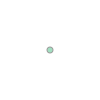

In [38]:
single_mine = data_utm.geometry[0]
single_mine           

In [40]:
distance = protected_areas_utm.distance(single_mine)
distance

0     1.975936e+06
1     4.382726e+05
2     8.370021e+04
3     9.723625e+05
4     8.410804e+05
5     1.594780e+05
6     1.167624e+06
7     1.081372e+06
8     5.229051e+05
9     4.838609e+05
10    1.133980e+06
11    6.847434e+05
12    1.166480e+06
13    2.217272e+05
14    1.649761e+06
15    5.648862e+05
16    2.027804e+06
17    4.537492e+05
18    8.910110e+05
19    1.340168e+06
20    1.922936e+05
21    3.479939e+05
22    2.156706e+04
23    1.578643e+05
24    1.942011e+05
25    3.116549e+05
26    2.515559e+05
27    3.114695e+05
28    2.983445e+05
29    6.350816e+05
30    1.243643e+06
31    1.306363e+06
32    1.395043e+06
33    5.689090e+05
34    1.275792e+06
35    1.347020e+06
36    1.113154e+06
37    1.169434e+06
38    1.362068e+06
39    1.407491e+06
40    1.425910e+06
41    2.325664e+05
42    1.273525e+06
43    1.678765e+06
44    1.620183e+06
45    1.636308e+06
46    7.805325e+05
47    1.250720e+06
48    1.338209e+06
49    1.350821e+06
dtype: float64

In [41]:
idx = distance.idxmin()
closest_area = protected_areas_utm.loc[idx, 'NAME_AP']
closest_area

'Virunga National park'

In [42]:
def closest_protected_area(mine, protected_areas):
  distance = protected_areas.distance(mine)
  idx = distance.idxmin()
  closest_area = protected_areas.loc[idx, 'NAME_AP']
  return closest_area

In [43]:
result = data_utm.geometry.apply(lambda site: closest_protected_area(site, protected_areas_utm))
result

0       Virunga National park
1       Virunga National park
2       Virunga National park
3       Virunga National park
4       Virunga National park
                ...          
2455    Virunga National park
2456    Virunga National park
2457    Virunga National park
2458    Virunga National park
2459    Virunga National park
Name: geometry, Length: 2460, dtype: object


    Add information about the protected areas to the mining sites dataset, using a spatial join:
        Call the result `data_within_protected`
        If the result is empty, this is an indication that the coordinate reference system is not matching. Make sure to re-project the data (see above).
    How many mining sites are located within a national park?
    Count the number of mining sites per national park (pandas tip: check `value_counts()`)


In [44]:
data_within_protected = geopandas.sjoin(data_utm, protected_areas_utm[['NAME_AP', 'geometry']], op='within', how='inner')
data_within_protected

,pcode,vid,project,visit_date,name,workers_numb,interference,armed_group1,mineral1,geometry,index_right,NAME_AP
251,codmine00260,1084,IPIS - PROMINES MoFA 2013-2014,2013-09-06,Kiviri/Tayna,244.0,1.0,Maï-Maï UPCP,Or,POINT (709734.913 9961013.720),23,Tayna Nature Reserve
2318,codmine03323,4414,IPIS - IOM 2016-2018,2018-12-19,Kanyabi,105.0,1.0,NDC-Rénové,Or,POINT (694007.830 9971029.838),23,Tayna Nature Reserve
2319,codmine03324,4415,IPIS - IOM 2016-2018,2018-12-19,Ngoma,52.0,1.0,NDC-Rénové,Or,POINT (693343.363 9972108.466),23,Tayna Nature Reserve
2320,codmine03325,4416,IPIS - IOM 2016-2018,2018-12-20,Tozali,150.0,1.0,NDC-Rénové,Or,POINT (693348.372 9972103.306),23,Tayna Nature Reserve
2321,codmine03326,4417,IPIS - IOM 2016-2018,2018-12-20,Momanda,68.0,1.0,NDC-Rénové,Or,POINT (693356.909 9972121.366),23,Tayna Nature Reserve
...,...,...,...,...,...,...,...,...,...,...,...,...
1251,codmine01325,2272,IPIS - IOM PROMINES 2015,2015-06-30,Ujumo Kopa,192.0,1.0,NDC-Rénové,Or,POINT (591129.707 9917867.683),5,Maiko National park
1278,codmine01410,2812,IPIS - IOM PROMINES 2015,2015-11-03,Angumu (rivière),51.0,1.0,Maï-Maï Kumu,Or,POINT (581603.568 9983419.125),5,Maiko National park
1346,codmine01523,375,IPIS - 2010,2010-01-01,Maisha,250.0,NaN,Maï-Maï Simba,Or,POINT (539481.512 9970198.975),5,Maiko National park
2299,codmine03244,4338,IPIS - IOM 2016-2018,2018-10-16,Kyenze1,80.0,0.0,None,Cassitérite,POINT (411544.379 8960051.951),7,Upemba National park


In [46]:
data_within_protected['NAME_AP'].value_counts()

Itombwe Nature Reserve          21
Luama-Katanga Hunting Domain    20
Tayna Nature Reserve            13
Kahuzi-Biega National park      12
Luama-Kivu Hunting Domain        9
Okapi Faunal Reserve             5
Maiko National park              3
Upemba National park             2
Name: NAME_AP, dtype: int64

In [47]:
data_within_protected.groupby('NAME_AP').size()

NAME_AP
Itombwe Nature Reserve          21
Kahuzi-Biega National park      12
Luama-Katanga Hunting Domain    20
Luama-Kivu Hunting Domain        9
Maiko National park              3
Okapi Faunal Reserve             5
Tayna Nature Reserve            13
Upemba National park             2
dtype: int64

In [48]:
data_within_protected.groupby('NAME_AP')['workers_numb'].sum()

NAME_AP
Itombwe Nature Reserve          3194.0
Kahuzi-Biega National park      1219.0
Luama-Katanga Hunting Domain    1394.0
Luama-Kivu Hunting Domain       1057.0
Maiko National park              493.0
Okapi Faunal Reserve             997.0
Tayna Nature Reserve            1173.0
Upemba National park             108.0
Name: workers_numb, dtype: float64


    Create a new dataset, `protected_areas_borders`, that contains the border area (10 km wide) of each protected area:
        Tip: one way of doing this is with the `buffer` and `difference` function.
        Plot the resulting borders as a visual check of correctness.
    Count the number of mining sites per national park that are located within its borders


In [49]:
protected_areas_borders = protected_areas_utm[['NAME_AP','geometry']].copy()
protected_areas_borders

,NAME_AP,geometry
0,Luki Biosphere Reserve,"POLYGON ((-1038121.473 9375412.190, -1038053.9..."
1,Itombwe Nature Reserve,"POLYGON ((637994.488 9590686.863, 637948.840 9..."
2,Okapi Faunal Reserve,"POLYGON ((704388.260 10148801.817, 708890.818 ..."
3,Salonga National park,"POLYGON ((-112340.105 9717100.363, -112337.911..."
4,Salonga National park,"POLYGON ((-97046.374 9846612.024, -96986.183 9..."
5,Maiko National park,"POLYGON ((594366.608 9933949.825, 594316.005 9..."
6,Kundelungu National park,"MULTIPOLYGON (((586910.847 8807913.612, 588409..."
7,Upemba National park,"POLYGON ((436132.757 9083607.078, 437111.346 9..."
8,Yangambi Biosphere Reserve,"POLYGON ((274923.603 10069241.177, 268008.092 ..."
9,Bili-Uere Hunting Domain,"POLYGON ((548894.473 10555107.327, 549040.882 ..."


In [51]:
protected_areas_borders['geometry'] = protected_areas_borders.buffer(10000).difference(protected_areas_utm.unary_union)
protected_areas_borders

,NAME_AP,geometry
0,Luki Biosphere Reserve,"POLYGON ((-1076271.811 9351342.570, -1076385.9..."
1,Itombwe Nature Reserve,"MULTIPOLYGON (((610508.808 9603792.613, 610497..."
2,Okapi Faunal Reserve,"POLYGON ((589790.679 10145337.171, 589785.829 ..."
3,Salonga National park,"POLYGON ((-287827.641 9800165.951, -287889.735..."
4,Salonga National park,"POLYGON ((-218076.831 9891880.455, -218065.908..."
5,Maiko National park,"POLYGON ((473437.303 9967443.887, 473200.046 9..."
6,Kundelungu National park,"MULTIPOLYGON (((505054.440 8980404.438, 505107..."
7,Upemba National park,"MULTIPOLYGON (((375325.480 8940204.299, 375338..."
8,Yangambi Biosphere Reserve,"POLYGON ((219164.796 10063728.469, 219011.155 ..."
9,Bili-Uere Hunting Domain,"MULTIPOLYGON (((31031.451 10505011.244, 30999...."


<AxesSubplot:>

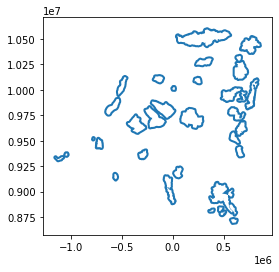

In [52]:
protected_areas_borders.plot()

In [54]:
data_within_border = geopandas.sjoin(data_utm, protected_areas_borders, op='within', how='inner')
data_within_border

,pcode,vid,project,visit_date,name,workers_numb,interference,armed_group1,mineral1,geometry,index_right,NAME_AP
2,codmine00003,662,IPIS - PROMINES MoFA 2013-2014,2013-03-27,Molende,130.0,1.0,FARDC,Or,POINT (795641.707 10109059.787),22,Virunga National park
4,codmine00005,664,IPIS - PROMINES MoFA 2013-2014,2013-03-27,Apumu-Atandele-Jerusalem-Luka Yayo,270.0,1.0,FRPI,Or,POINT (796057.504 10105781.548),22,Virunga National park
284,codmine00294,4650,IPIS - IOM,2019-11-26,Mabuku,52.0,1.0,UPLC,Or,POINT (755726.357 10037477.030),22,Virunga National park
285,codmine00295,1588,IPIS - PROMINES MoFA 2013-2014,2014-02-20,Loulo/Mapata,228.0,0.0,FARDC,Or,POINT (757715.061 10032640.047),22,Virunga National park
288,codmine00298,1603,IPIS - PROMINES MoFA 2013-2014,2014-03-03,Kimemi,68.0,0.0,FARDC,Or,POINT (756820.065 10019656.239),22,Virunga National park
...,...,...,...,...,...,...,...,...,...,...,...,...
2344,codmine03352,4326,IPIS - Ulula 2018,2018-10-09,Makaka,36.0,0.0,None,Cassitérite,POINT (378189.500 8956377.599),30,Mulumbu Hunting Domain
2347,codmine03355,4347,IPIS - IOM 2016-2018,2018-10-24,Tena bien,30.0,0.0,None,Cassitérite,POINT (403717.380 8940878.432),30,Mulumbu Hunting Domain
2348,codmine03356,4349,IPIS - IOM 2016-2018,2018-10-25,Tembeya bien,35.0,0.0,None,Cassitérite,POINT (403922.238 8940232.097),30,Mulumbu Hunting Domain
2349,codmine03357,4351,IPIS - IOM 2016-2018,2018-10-27,Kimabwe centrale,60.0,0.0,None,Cassitérite,POINT (398061.789 8934297.429),30,Mulumbu Hunting Domain


In [55]:
data_within_border['NAME_AP'].value_counts()

Kahuzi-Biega National park      215
Okapi Faunal Reserve            113
Maiko National park              98
Kisimba Ikobo Nature Reserve     68
Itombwe Nature Reserve           66
Tayna Nature Reserve             61
Luama-Kivu Hunting Domain        31
Upemba National park             29
Virunga National park            25
Mulumbu Hunting Domain           21
Luama-Katanga Hunting Domain     16
Name: NAME_AP, dtype: int64